# 任务一 路网匹配
*路网可视化在编译器深色模式下生成，浅色模式下可能导致不清晰*

In [53]:
import transbigdata as tbd
import pandas as pd
import CoordinatesConverter

# 读入GPS路径
data = pd.read_csv("C:\\Users\\Xu\\Desktop\\pycharm\\data\\traj.csv",low_memory=False)
data.columns = ['id','time','entity_id','traj_id','coordinates','current_dis','speeds','holidays']
data.head()

,id,time,entity_id,traj_id,coordinates,current_dis,speeds,holidays
0,0,2013-10-08T17:45:00Z,254,0,"[116.318726,40.009014]",0.000000,36.6900,0
1,1,2013-10-08T17:46:45Z,254,0,"[116.315102,40.004784]",0.562623,24.5375,0
2,2,2013-10-08T17:47:39Z,254,0,"[116.315018,40.002842]",0.778695,31.9675,0
3,3,2013-10-08T17:49:26Z,254,0,"[116.315041,39.998585]",1.252148,19.7850,0
4,4,2013-10-08T17:51:15Z,254,0,"[116.315605,39.992554]",1.924533,24.4500,0


最小经度: 116.2500662
最大经度: 116.5018476
最小纬度: 39.7955236
最大纬度: 40.0006224


<Axes: >

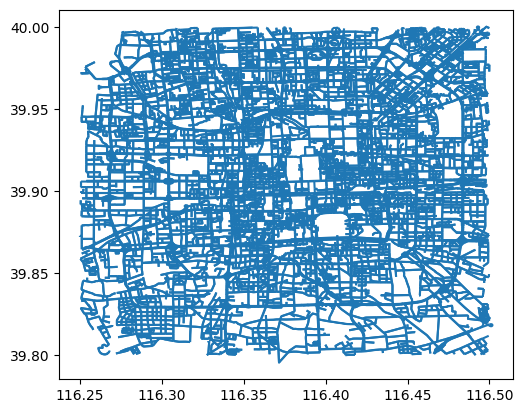

In [54]:
import geopandas as gpd

sz = gpd.read_file("C:\\Users\\Xu\\Desktop\\pycharm\\data\\roads_shapefile.shp")
# 获取地图边界
bounds = sz.total_bounds
min_longitude, min_latitude, max_longitude, max_latitude = bounds

# 打印经纬度极值
print("最小经度:", min_longitude)
print("最大经度:", max_longitude)
print("最小纬度:", min_latitude)
print("最大纬度:", max_latitude)

sz.plot()

In [55]:
# 设置边界
bounds = [116.197922,39.759785,116.548103,40.025291]

params = tbd.area_to_params(bounds,accuracy=30)
params


{'slon': 116.197922,
 'slat': 39.759785,
 'deltalon': 0.00035164128333345395,
 'deltalat': 0.0002697963123853744,
 'theta': 0,
 'method': 'rect',
 'gridsize': 30}

,LONCOL,LATCOL,entity_id,geometry
0,-17,113,1,"POLYGON ((116.19177 39.79014, 116.19212 39.790..."
1,-17,114,1,"POLYGON ((116.19177 39.79041, 116.19212 39.790..."
2,-17,115,3,"POLYGON ((116.19177 39.79068, 116.19212 39.790..."
3,-17,116,3,"POLYGON ((116.19177 39.79095, 116.19212 39.790..."
4,-17,179,5,"POLYGON ((116.19177 39.80794, 116.19212 39.807..."
...,...,...,...,...
91891,979,703,1,"POLYGON ((116.54200 39.94932, 116.54235 39.949..."
91892,979,704,1,"POLYGON ((116.54200 39.94959, 116.54235 39.949..."
91893,979,760,1,"POLYGON ((116.54200 39.96470, 116.54235 39.964..."
91894,979,778,1,"POLYGON ((116.54200 39.96955, 116.54235 39.969..."


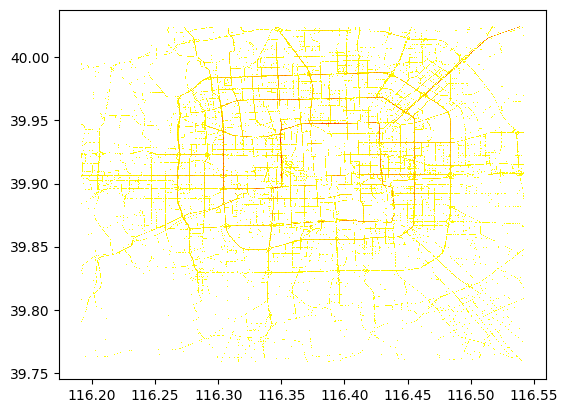

In [56]:
file_path = "C:\\Users\\Xu\\Desktop\\pycharm\\data\\traj.csv"
data = pd.read_csv(file_path, low_memory=False)

# 分解 'coordinates' 列为 'latitude' 和 'longitude'
data[['longitude', 'latitude']] = data['coordinates'].str.strip('[]').str.split(',', expand=True).astype(float)
data['longitude'],data['latitude'] = CoordinatesConverter.gcj02towgs84(data['longitude'],data['latitude'])
data['LONCOL'],data['LATCOL'] = tbd.GPS_to_grid(data['longitude'],data['latitude'],params)


# 聚合集计栅格内数据量
grid_agg=data.groupby(['LONCOL','LATCOL'])['entity_id'].count().reset_index()

# 生成栅格的几何图形
grid_agg['geometry']=tbd.grid_to_polygon([grid_agg['LONCOL'],grid_agg['LATCOL']],params)

# 转换为GeoDataFrame
grid_agg=gpd.GeoDataFrame(grid_agg)

# 绘制栅格
grid_agg.plot(column = 'entity_id',cmap = 'autumn_r')
grid_agg

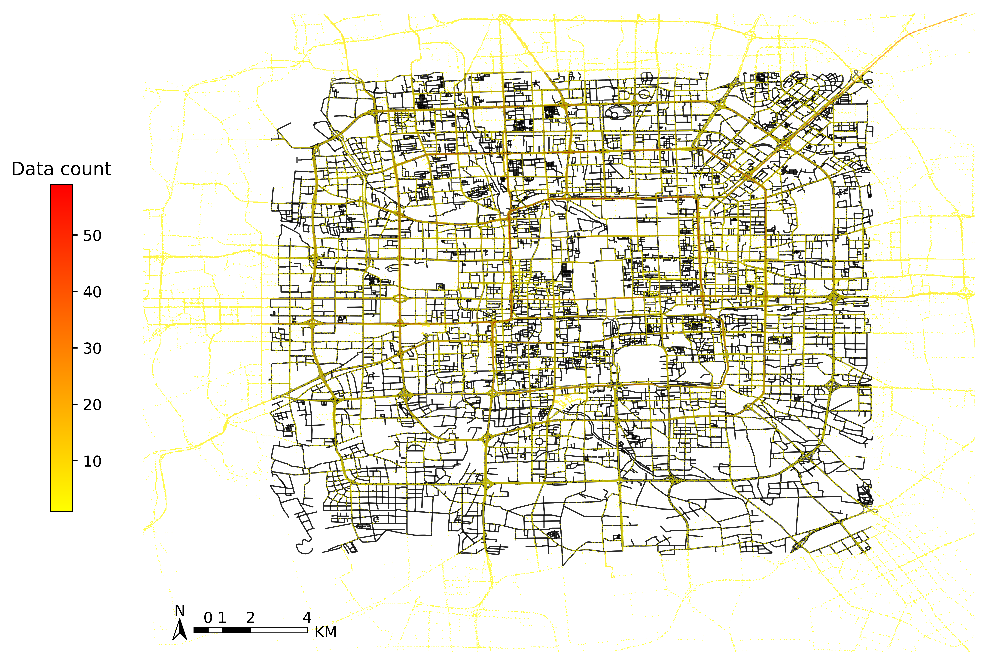

In [57]:
import matplotlib.pyplot as plt

fig =plt.figure(1,(10,10),dpi=800)

ax =plt.subplot(111)
plt.sca(ax)

# 添加行政区划边界作为底图
sz.plot(ax=ax,edgecolor=(0,0,0,0.6),facecolor=(0,0,0,0),linewidths=0.8,zorder = 1)

# 定义色条位置
cax = plt.axes([0.04, 0.33, 0.02, 0.3])
plt.title('Data count')
plt.sca(ax)

# 绘制数据
grid_agg.plot(column = 'entity_id',cmap = 'autumn_r',alpha = 0.7,ax = ax,cax = cax,legend = True,zorder = 2)

# 添加指北针和比例尺
tbd.plotscale(ax,bounds = bounds,textsize = 10,compasssize = 1,accuracy = 500,rect = [0.06,0.03],zorder = 10)
plt.axis('off')
plt.xlim(bounds[0],bounds[2])
plt.ylim(bounds[1],bounds[3])
plt.show()

In [58]:
file_path = "C:\\Users\\Xu\\Desktop\\pycharm\\data\\traj.csv"
data = pd.read_csv(file_path, low_memory=False)
data[['longitude', 'latitude']] = data['coordinates'].str.strip('[]').str.split(',', expand=True).astype(float)
data['longitude'],data['latitude'] = CoordinatesConverter.gcj02towgs84(data['longitude'],data['latitude'])
data['LONCOL'],data['LATCOL'] = tbd.GPS_to_grid(data['longitude'],data['latitude'],params)

# 根据 traj_id 生成新的一列 OpenStatus，对于每个 traj_id 的第一行设置为 1，其余设置为 0
data['OpenStatus'] = data.groupby('traj_id').cumcount().eq(0).astype(int)

# 查看修改后的数据的前几行
data.head()

,id,time,entity_id,traj_id,coordinates,current_dis,speeds,holidays,longitude,latitude,LONCOL,LATCOL,OpenStatus
0,0,2013-10-08T17:45:00Z,254,0,"[116.318726,40.009014]",0.000000,36.6900,0,116.312600,40.007716,326,919,1
1,1,2013-10-08T17:46:45Z,254,0,"[116.315102,40.004784]",0.562623,24.5375,0,116.308985,40.003493,316,903,0
2,2,2013-10-08T17:47:39Z,254,0,"[116.315018,40.002842]",0.778695,31.9675,0,116.308901,40.001551,316,896,0
3,3,2013-10-08T17:49:26Z,254,0,"[116.315041,39.998585]",1.252148,19.7850,0,116.308925,39.997295,316,880,0
4,4,2013-10-08T17:51:15Z,254,0,"[116.315605,39.992554]",1.924533,24.4500,0,116.309488,39.991263,317,858,0


In [72]:
oddat = tbd.taxigps_to_od(data,col = ['entity_id','time','longitude','latitude','OpenStatus'])
oddat.head()

,entity_id,stime,slon,slat,etime,elon,elat,ID
21,254,2013-10-08T18:45:00Z,116.343965,39.945733,2013-10-08T18:45:54Z,116.342915,39.951702,0
26,254,2013-10-08T19:15:00Z,116.321976,39.966453,2013-10-08T19:16:49Z,116.321625,39.973462,1
50,254,2013-10-08T20:00:00Z,116.331556,39.927064,2013-10-08T20:01:47Z,116.331511,39.925058,2
66,254,2013-10-08T20:30:00Z,116.308815,39.902785,2013-10-08T20:30:36Z,116.308862,39.899294,3
79,254,2013-10-08T20:45:00Z,116.338567,39.868546,2013-10-08T20:45:20Z,116.338718,39.874984,4


<Axes: >

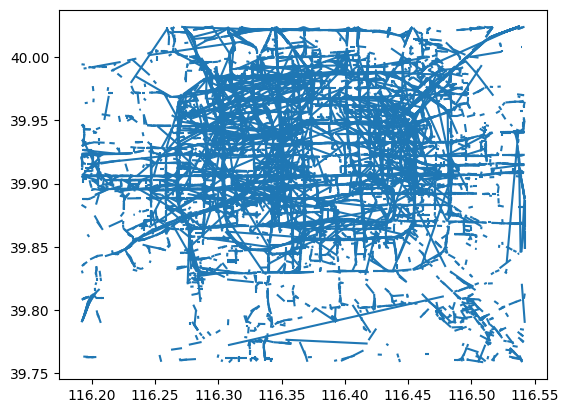

In [60]:
params = tbd.area_to_params(bounds,accuracy=20)
od_gdf = tbd.odagg_grid(oddat,params)
od_gdf.plot()

In [61]:
import CoordinatesConverter
# 匹配GPS文件与地图文件的经纬度格式
data['longitude'],data['latitude'] = CoordinatesConverter.gcj02towgs84(data['longitude'],data['latitude'])

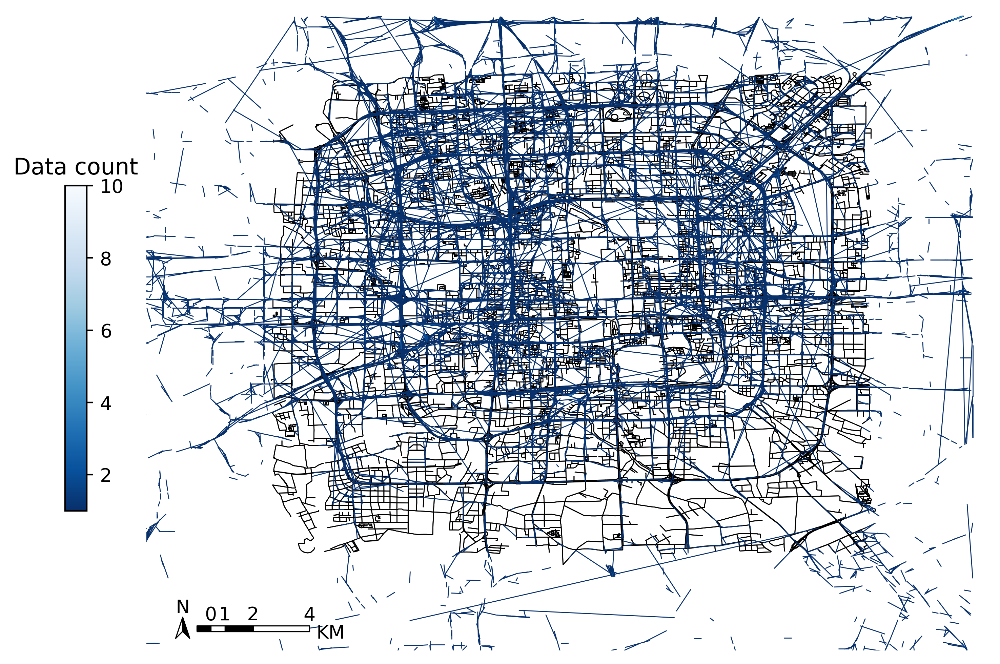

In [62]:
# 创建图框
import matplotlib.pyplot as plt

fig =plt.figure(1,(8,8),dpi=400)
ax =plt.subplot(111)
plt.sca(ax)

# 添加行政区划边界作为底图
sz.plot(ax=ax,edgecolor=(0,0,0,1),facecolor=(0,0,0,0),linewidths=0.5)

# 绘制colorbar
cax=plt.axes([0.05, 0.33, 0.02, 0.3])
plt.title('Data count')
plt.sca(ax)

# 绘制OD
od_gdf.plot(ax = ax,column = 'count',cmap = 'Blues_r',linewidth = 0.5,vmax = 10,cax = cax,legend = True)

# 添加比例尺和指北针
tbd.plotscale(ax,bounds=bounds,textsize=10,compasssize=1,accuracy=500,rect = [0.06,0.03],zorder = 10)
plt.axis('off')
plt.xlim(bounds[0],bounds[2])
plt.ylim(bounds[1],bounds[3])
plt.show()

## 路网匹配

In [1]:
import osmnx as ox
from leuvenmapmatching.map.inmem import InMemMap
from leuvenmapmatching.matcher.distance import DistanceMatcher
import geopandas as gpd
from shapely.geometry import LineString, Point
import pandas as pd

# 加载路网数据
def load_road_network():
    beijing_center = (39.9042, 116.4074)  # 北京市中心坐标
    G = ox.graph_from_point(beijing_center, dist=5000, network_type='drive')
    nodes, edges = ox.graph_to_gdfs(G)
    return nodes, edges


# 构建 InMemMap
def build_map(nodes, edges):
    map_con = InMemMap("BeijingMap", use_latlon=True)

    # 首先添加所有节点
    for node_id, row in nodes.iterrows():
        map_con.add_node(node_id, (row['x'], row['y']))

    # 然后添加边，确保使用节点 ID 而非坐标
    for _, row in edges.iterrows():
        if isinstance(row.geometry, LineString):
            coords = list(row.geometry.coords)
            # 获得起点和终点对应的节点 ID
            start_node_id = ox.get_nearest_node(G, coords[0])
            end_node_id = ox.get_nearest_node(G, coords[-1])
            map_con.add_edge(start_node_id, end_node_id)
            map_con.add_edge(end_node_id, start_node_id)  # 双向道路

    return map_con



# 加载 GPS 轨迹数据
def load_gps_data(file_path):
    data = pd.read_csv(file_path)
    data[['longitude', 'latitude']] = data['coordinates'].str.strip('[]').str.split(',', expand=True).astype(float)
    return data

# 进行地图匹配
def map_matching(map_con, gps_data):
    path = [(row['latitude'], row['longitude']) for _, row in gps_data.iterrows()]
    matcher = DistanceMatcher(map_con,
                              max_dist=500,
                              max_dist_init=170,
                              min_prob_norm=0.0001,
                              non_emitting_length_factor=0.95,
                              obs_noise=50,
                              obs_noise_ne=50,
                              dist_noise=50,
                              max_lattice_width=60,
                              non_emitting_states=True)
    states, _ = matcher.match(path)
    return states


import matplotlib.pyplot as plt
from shapely.geometry import LineString


# 将匹配的状态转换为线段，用于可视化
def match_to_linestring(states, map_con):
    lines = []
    for state in states:
        node = map_con.nodes[state[0]]
        next_node = map_con.nodes[state[1]]
        line = LineString([node, next_node])
        lines.append(line)
    return lines


# 可视化匹配结果

def visualize_match(G, map_con, states, ax):
    # 提取并绘制匹配到的道路段
    for state in states:
        # state 是 (node1, node2) 的元组
        node1 = map_con.node_coordinates(state[0])
        node2 = map_con.node_coordinates(state[1])
        line = LineString([node1, node2])
        xs, ys = line.xy
        ax.plot(xs, ys, color='red', linewidth=3, alpha=0.7)


C:\Users\Xu\AppData\Local\Temp\ipykernel_27232\1251132919.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  edges['lon'] = edges.centroid.x
C:\Users\Xu\AppData\Local\Temp\ipykernel_27232\1251132919.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  edges['lat'] = edges.centroid.y


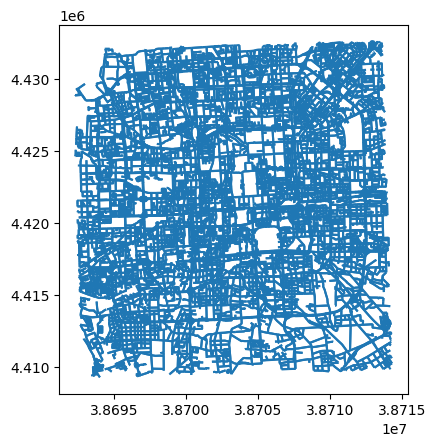

In [5]:
bounds = [116.2500662, 39.7955236, 116.5018476, 40.0006224]  # 北京路网
north, south, east, west = bounds[3], bounds[1], bounds[2], bounds[0]
G = ox.graph_from_bbox(north, south, east, west, network_type='drive')
# 存储路网
ox.save_graphml(G, 'Beijing.graphml')

# 获取道路中心点坐标
nodes, edges = ox.graph_to_gdfs(G, nodes=True, edges=True)
edges['lon'] = edges.centroid.x
edges['lat'] = edges.centroid.y

# 转换路网的坐标系
G_p = ox.project_graph(G, to_crs=2362)
nodes_p, edges_p = ox.graph_to_gdfs(G_p, nodes=True, edges=True)
edges_p.plot()

# 将路网转换为网络
map_con = InMemMap(name='beijing', use_latlon=False, use_rtree=True, index_edges=True)

# 构建网络
for node_id, row in nodes_p.iterrows():
    map_con.add_node(node_id, (row['y'], row['x']))
for node_id_1, node_id_2, _ in G_p.edges:
    map_con.add_edge(node_id_1, node_id_2)

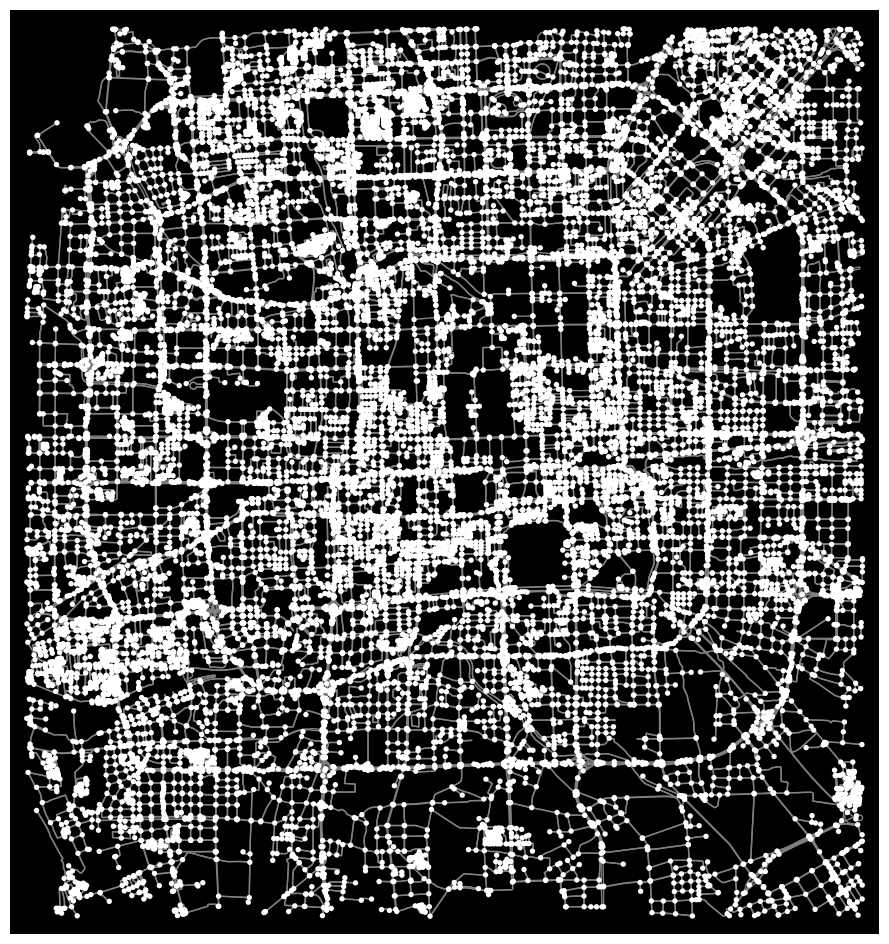

In [4]:
file_path = "C:\\Users\\Xu\\Desktop\\pycharm\\pythonProject\\Task-one\\data\\traj.csv"
gps_data = load_gps_data(file_path)

# 初始化绘图
fig, ax = plt.subplots(figsize=(12, 12))

# 从 OpenStreetMap 绘制路网
ox.plot_graph(G, ax=ax, show=False, close=False, edge_color='grey')

for entity_id in gps_data['entity_id'].unique():
    entity_data = gps_data[gps_data['entity_id'] == entity_id]
    if not entity_data.empty:
        states = map_matching(map_con, entity_data)
        visualize_match(G, map_con, states, ax)

ax.set_facecolor('black')
plt.show()